# A2-Q5: Pursuit Problem

In [1]:
import numpy as np

from scipy.integrate import solve_ivp
from scipy.interpolate import make_interp_spline

import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

%matplotlib inline

In [2]:
def distance(x_t, y_t, z_t, x_p, y_p, z_p):
    return np.sqrt((x_t - x_p) ** 2 + (y_t - y_p) ** 2 + (z_t - z_p) ** 2)

In [3]:
def target(t):
    #
    # The target path is a helix
    #
    x_t = np.sin(t)
    y_t = np.cos(t)
    z_t = t
    return np.array([x_t, y_t, z_t])

In [4]:
def rocket(t,P,SP,DMIN):
    #
    # This is the function that is called by the ODE solver.
    # It implements the differential equations defining
    # the trajectory of the pursuer.
    #
    # t: time
    # P: position of the pursuer -> assume this is tuple being fed in per iteration
    # SP: Speed of the pursuer
    #
    # DMIN is not used here
    #   
    x_t, y_t, z_t = target(t)
    x_p, y_p, z_p = P
    dist = distance(x_t, y_t, z_t, x_p, y_p, z_p)

    dxp = SP / dist * (x_t - x_p)
    dyp = SP / dist * (y_t - y_p)
    dzp = SP / dist * (z_t - z_p)
    #dist(t) = √(xT (t) − xP (t))2 + (yT (t) − yP (t))2 + (zT (t) − zP (t))2
    return np.array([dxp, dyp, dzp])

In [5]:
def rocket_events(t,P,SP,DMIN):
    #
    # This is the event function.
    # When the rocket gets within DMIN of the target,
    # it records the time t at which this happens, and
    # terminates the ODE solver.
    #
    # t: time
    # P: position of pursuer
    # SP is not used here
    #print(target(t))
    x_t, y_t, z_t = target(t)
    x_p, y_p, z_p = P
    dist = distance(x_t, y_t, z_t, x_p, y_p, z_p) # between target and P
    #print(dist)
    #print(DMIN)
    #print(dist > DMIN)
    return dist > DMIN
    

In [6]:
def animate(n,t,P):
    #
    # Plot the trajectory of the pursuer and target
    #
    # n: n-th frame of the animation
    # t[n]: time of n-th frame
    # P[n]: coordinates of the pursuer at time t[n]
    #
    T = target(t[n])
    Tx = [T[0]]; Ty = [T[1]]; Tz = [T[2]]
    Px = [P[n][0]]; Py = [P[n][1]]; Pz = [P[n][2]]

    # matplotlib axis
    
    ax.plot(Px, Py, Pz, 'go')
    ax.plot(Tx, Ty, Tz, 'bx')

============= SP = 1.4 ===============
Number of timesteps for sol1, sol2: 152 , 35
Number of evaluations for sol1, sol2: 463 , 223
sol1 num of nfev per timestep: 3.0460526315789473
sol2 num of nfev per timestep: 6.371428571428571
============= SP = 1.5 ===============
Number of timesteps for sol1, sol2: 142 , 45
Number of evaluations for sol1, sol2: 433 , 289
sol1 intercepts: 12.515213904670233
sol2 intercepts: 12.502317151096602
sol1 num of nfev per timestep: 3.0492957746478875
sol2 num of nfev per timestep: 6.4222222222222225
============= SP = 1.6 ===============
Number of timesteps for sol1, sol2: 95 , 28
Number of evaluations for sol1, sol2: 292 , 193
sol1 intercepts: 8.25246722982664
sol2 intercepts: 8.240967082697148
sol1 num of nfev per timestep: 3.0736842105263156
sol2 num of nfev per timestep: 6.892857142857143
============= SP = 1.7 ===============
Number of timesteps for sol1, sol2: 74 , 22
Number of evaluations for sol1, sol2: 229 , 193
sol1 intercepts: 6.2748095362350025

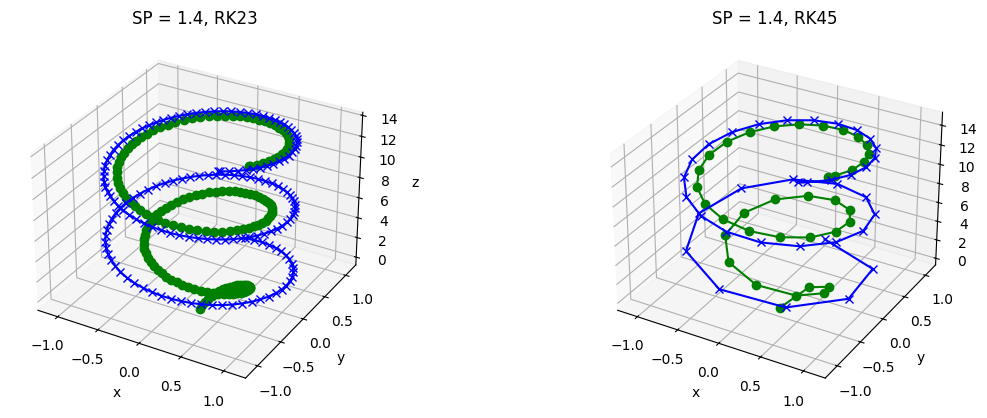

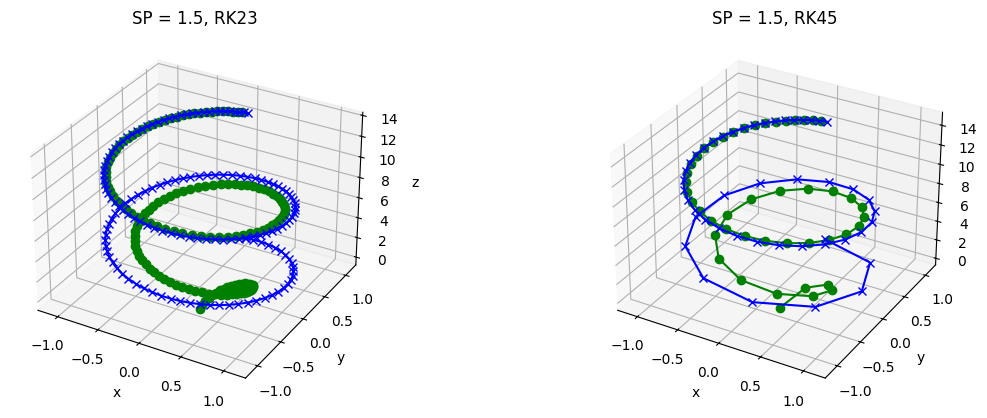

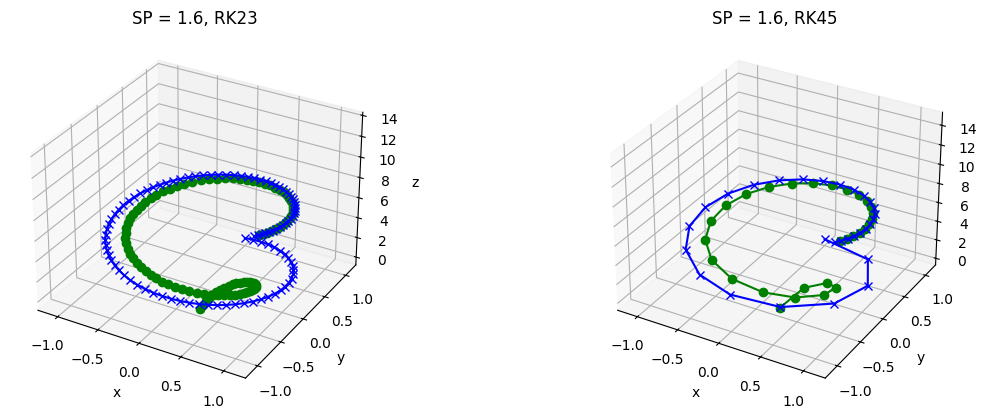

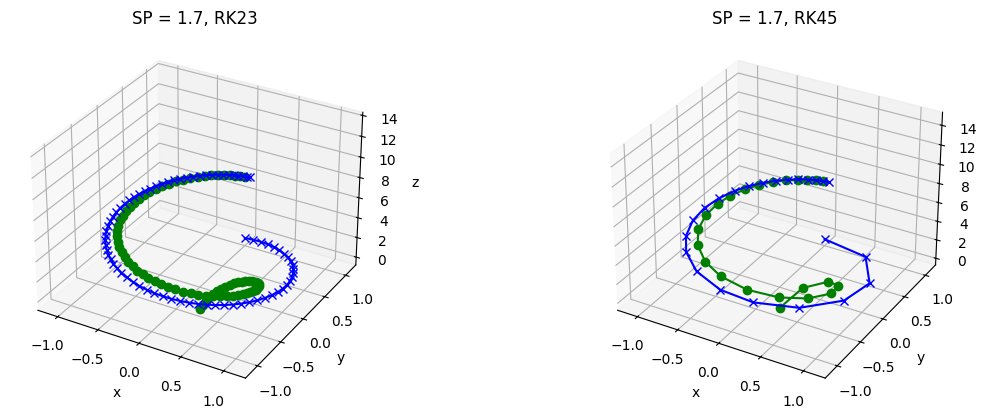

In [7]:
#
# Main program
#

#
# Set up parameter values for the pursuit problem
# t0, tfinal, etc
#
t0 = 0
tfinal = 15
P = (0,0,-3)
DMIN = 0.1

#
# Set up parameter values for the ODE solver
# abs tol, rel tol, etc
#
atol = 0.00001
rtol = 0.00001
first_step = 1
max_step = 1

#
# Solving ODEs
#
for SP in [1.4, 1.5, 1.6, 1.7]:
    #
    # Call ode solvers:
    event=rocket_events
    event.terminal = True
    sol1 = solve_ivp(method = 'RK23', fun = rocket, t_span = (t0, tfinal), y0 = P, events=event,
                     atol=atol, rtol=rtol, first_step = first_step, max_step = max_step, args=(SP,DMIN))
    sol2 = solve_ivp(method = 'RK45', fun = rocket, t_span = (t0, tfinal), y0 = P, events=event,
                     atol=atol, rtol=rtol, first_step = first_step, max_step = max_step ,args=(SP,DMIN))
    #
    #print(sol1)
    #print(sol2)
    #
    # Display numerical results
    # number of time steps, number of evaluations, time of intercept
    #
    # expensive part is any calculations
    
    print(f"============= SP = {SP} ===============")
    print("Number of timesteps for sol1, sol2:", len(sol1.t) - 1, ",", len(sol2.t) - 1)
    print("Number of evaluations for sol1, sol2:", sol1.nfev, ",", sol2.nfev)
    

    if len(sol1.y_events[0]) > 0:
        print("sol1 intercepts:", sol1.y_events[0][0][-1])
    if len(sol2.y_events[0]) > 0:
        print("sol2 intercepts:", sol2.y_events[0][0][-1])
    
    # commenting on the number of time steps and function evaluations.
    print("sol1 num of nfev per timestep:", sol1.nfev / (len(sol1.t) - 1))
    print("sol2 num of nfev per timestep:", sol2.nfev / (len(sol2.t) - 1))
    # Display trajectories of 
    # Green: pursuer
    # Blue: target
    #
    fig = plt.figure(figsize=plt.figaspect(0.35))
    ax1 = fig.add_subplot(1,2,1, projection='3d')
    ax1.set_xlim3d(-1.2,1.2)
    ax1.set_ylim3d(-1.2,1.2)
    ax1.set_zlim3d(-0.5,14)
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')
    ax1.set_zlabel('z')
    ax1.set_title('SP = %.1f, RK23' %(SP))
    P1x, P1y, P1z = sol1.y
    ax1.plot3D(P1x, P1y, P1z, 'go-')
    Tx, Ty, Tz = target(sol1.t)
    ax1.plot3D(Tx, Ty, Tz, 'bx-')   
    
    ax2 = fig.add_subplot(1,2,2, projection='3d')
    ax2.set_xlim3d(-1.2,1.2)
    ax2.set_ylim3d(-1.2,1.2)
    ax2.set_zlim3d(-0.4,15)
    ax2.set_xlabel('x')
    ax2.set_ylabel('y')
    ax2.set_zlabel('z')
    ax2.set_title('SP = %.1f, RK45' %(SP))
    P2x, P2y, P2z = sol2.y
    ax2.plot3D(P2x, P2y, P2z, 'go-')
    Tx, Ty, Tz = target(sol2.t)
    ax2.plot3D(Tx, Ty, Tz, 'bx-')   

### (d) 
As we can see from the above printouts, the calculated efficiencies for sol1 is much lower per timestep than sol2. Since the computationally expensive component for these methods are the actual number of evaluations, we can see that sol1 is more efficient per timestep. However, for these specific examples, we note that sol2 takes fewer timesteps in general, as sol1 (RK23) does require more timesteps to hit the same level of accuracy as sol2 (RK45).

[ 0.          0.83544933  1.58321249  2.24150237  2.89979225  3.52625486
  4.10485326  4.62989105  5.10890353  5.54559318  5.95308461  6.33023898
  6.68069659  7.01281227  7.32817227  7.62378982  7.9028893   8.17009678
  8.42811623  8.67483748  8.90871975  9.13157066  9.34572941  9.55298345
  9.75430851  9.94890945 10.13475965 10.31211972 10.48206985 10.64564852
 10.80368978 10.95682018 11.10540729 11.24935875 11.38776677 11.52002046
 11.64623786 11.76685982 11.88233486 11.99304973 12.099323   12.20141259
 12.29952268 12.39380558 12.48435683 12.57120241]


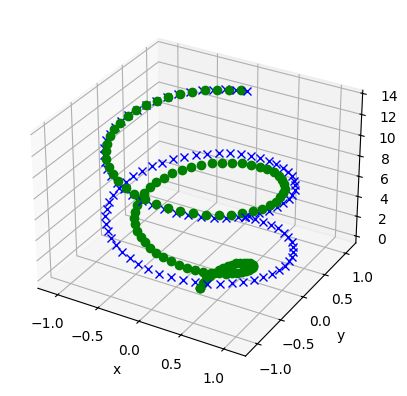

In [8]:
# (This one is just for fun)
#
# Animation of trajectories
# Green: pursuer
# Blue: target
#
fig = plt.figure()

ax = plt.axes(projection='3d')
ax.set_xlim3d(-1.2,1.2)
ax.set_ylim3d(-1.2,1.2)
ax.set_zlim3d(-0.4,14)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

#
# Solve the ODE for SP=1.5
#
SP = 1.5
sol = solve_ivp(method = 'RK45', fun = rocket, t_span = [t0, tfinal], y0 = P, events=rocket_events,
                    atol=atol, rtol=rtol, first_step=first_step, max_step=max_step,args=(SP,DMIN))
t = sol.t
print(t)
P = sol.y.T
n = np.size(t)

m = 100
cs = make_interp_spline(t,P)
tt = np.linspace(t[0],t[n-1],m)
PP = cs(tt)

# Create animation
anim = animation.FuncAnimation(fig, animate, frames = m, fargs = (tt, PP,), interval=100) # possibly
HTML(anim.to_jshtml())